In [1]:
import numpy as np
import pandas as pd

Reading the dataset

In [2]:
mydata = pd.read_csv("19880101_20191231.csv", index_col='Date')
mydata

,Open,High,Low,Close,Volume
Date,,,,,
1988-01-04,1950.80,2030.00,1950.80,2015.30,20877900
1988-01-05,2021.40,2075.30,2021.40,2031.50,27195361
1988-01-06,2031.50,2058.20,2012.80,2037.80,18790681
1988-01-07,2037.80,2061.50,2004.60,2051.90,21377283
1988-01-08,2051.90,2058.70,1898.00,1911.30,27445517
...,...,...,...,...,...
2019-12-24,28572.57,28576.80,28503.21,28515.45,86151979
2019-12-26,28539.46,28624.10,28535.15,28621.39,156025977
2019-12-27,28675.34,28701.66,28608.98,28645.26,182181663


In [3]:
mydata.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8064 entries, 1988-01-04 to 2019-12-31
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Open    8064 non-null   float64
 1   High    8064 non-null   float64
 2   Low     8064 non-null   float64
 3   Close   8064 non-null   float64
 4   Volume  8064 non-null   int64  
dtypes: float64(4), int64(1)
memory usage: 378.0+ KB


Feature Generation

In [4]:
def add_original_feature(df, df_new):
    df_new['open'] = df['Open']
    df_new['open_1'] = df['Open'].shift(1)
    df_new['close 1'] = df['Close'].shift(1)
    df_new['high_1'] = df['High'].shift(1)
    df_new['low 1'] = df['Low'].shift(1)
    df_new['volume 1'] = df['Volume'].shift(1)

A Function to generate features related to Average Close Prices

In [5]:
def add_avg_price(df, df_new):
    df_new['avg_price_5'] =df['Close'].rolling(5).mean().shift (1)
    df_new['avg_price_30']=df['Close'].rolling(21).mean().shift (1)
    df_new['avg_price_365']=df['Close'].rolling(252).mean().shift (1)
    df_new['ratio_avg_price_5_30']=df_new['avg_price_5'] / df_new['avg_price_30']
    df_new['ratio_avg_price_5_365']=df_new['avg_price_5'] / df_new['avg_price_365']
    df_new['ratio_avg_price_30_365']=df_new['avg_price_30'] / df_new['avg_price_365']

A Function to generate features related to Average Volume

In [6]:
def add_avg_volume (df, df_new):
    df_new['avg_volume_5']=df['Volume'].rolling(5).mean().shift(1)
    df_new['avg_volume_30']=df['Volume'].rolling(21).mean().shift(1)
    df_new['avg_volume_365']=df['Volume'].rolling(252).mean().shift(1)
    df_new['ratio_avg_volume_5_30']=df_new['avg_volume_5'] / df_new['avg_volume_30']
    df_new['ratio_avg_volume_5_365'] =df_new['avg_volume_5'] / df_new['avg_volume_365']
    df_new['ratio_avg_volume_30_365']=df_new['avg_volume_30'] / df_new['avg_volume_365']

A Function to generate features related to Standard Deviation of Close Prices based features

In [7]:
def add_std_price(df, df_new):
    df_new['std_price_5']=df['Close'].rolling(5).std().shift(1)
    df_new['std_price_30']=df['Close'].rolling(21).std().shift(1)
    df_new['std_price_365']=df['Close'].rolling(252).std().shift(1)
    df_new['ratio_std_price_5_30'] =df_new['std_price_5'] / df_new['std_price_30']
    df_new['ratio_std_price_5_365'] =df_new['std_price_5'] / df_new['std_price_365']
    df_new['ratio_std_price_30_365'] =df_new['std_price_30'] / df_new['std_price_365']

A Function to generate features related to Standard Deviation of Volume based features

In [8]:
def add_std_volume (df, df_new):
    df_new['std_volume_5']=df['Volume'].rolling(5).std().shift (1)
    df_new['std_volume_30']=df['Volume'].rolling(21).std().shift(1)
    df_new['std_volume_365']=df['Volume'].rolling(252).std().shift(1)
    df_new['ratio_std_volume_5_30']=df_new['std_volume_5'] /df_new['std_volume_30']
    df_new['ratio_std_volume_5_365']=df_new['std_volume_5'] /df_new['std_volume_365']
    df_new['ratio_std_volume_30_365']=df_new['std_volume_30'] /df_new['std_volume_365']

A function to generate return-based features

In [9]:
def add_return_feature(df, df_new):
    df_new['return_1']=((df['Close']-df['Close'].shift (1))/ df['Close'].shift(1)).shift(1)
    df_new['return_5']=((df['Close']-df['Close'].shift (5))/df['Close'].shift(5)).shift(1)
    df_new['return_30']=((df['Close' ]-df['Close'].shift (21)) / df['Close'].shift(21)).shift(1)
    df_new['return_365']=((df['Close']-df['Close'].shift (252)) / df['Close'].shift (252)).shift(1)
    df_new['moving_avg_5']=df_new['return_1'].rolling(5).mean().shift(1)
    df_new['moving_avg_30']=df_new['return_1'].rolling(21).mean().shift(1)
    df_new['moving_avg_365']=df_new['return_1'].rolling(252).mean ().shift(1)

Final Feature Generation Function

In [10]:
def generate_features(df):
    df_new = pd.DataFrame()
# 6 original features
    add_original_feature(df,df_new)
# 31 generated features
    add_avg_price(df, df_new) 
    add_avg_volume (df, df_new) 
    add_std_price(df, df_new) 
    add_std_volume(df, df_new)
    add_return_feature(df, df_new)
# the target
    df_new['close'] = df['Close']
    df_new = df_new.dropna (axis=0)
    return df_new

New Dataset with above generated features

In [11]:
data = generate_features(mydata)
data.head(5)

,open,open_1,close 1,high_1,low 1,volume 1,avg_price_5,avg_price_30,avg_price_365,ratio_avg_price_5_30,...,ratio_std_volume_5_365,ratio_std_volume_30_365,return_1,return_5,return_30,return_365,moving_avg_5,moving_avg_30,moving_avg_365,close
Date,,,,,,,,,,,,,,,,,,,,,
1989-01-04,2146.6,2168.4,2144.6,2168.4,2127.1,17302883.0,2165.00,2150.623810,2062.113095,1.006685,...,0.562543,0.722978,-0.011067,-0.011204,0.020315,0.055673,0.000770,0.001222,0.000354,2177.7
1989-01-05,2177.7,2146.6,2177.7,2183.4,2146.6,15714720.0,2168.00,2154.690476,2062.668254,1.006177,...,0.473516,0.723715,0.015434,0.006936,0.040816,0.068652,-0.002230,0.000979,0.000278,2190.5
1989-01-06,2190.5,2177.7,2190.5,2205.2,2173.0,20303094.0,2172.82,2157.866667,2063.218254,1.006930,...,0.579903,0.747630,0.005878,0.011124,0.031406,0.067547,0.001428,0.001931,0.000327,2194.3
1989-01-09,2194.3,2190.5,2194.3,2213.8,2182.3,16494441.0,2175.14,2160.004762,2064.341270,1.007007,...,0.515648,0.745619,0.001735,0.005315,0.020890,0.148067,0.002262,0.001494,0.000323,2199.5
1989-01-10,2199.5,2194.3,2199.5,2209.1,2185.0,18410324.0,2181.32,2162.190476,2065.350794,1.008847,...,0.278728,0.741686,0.002370,0.014249,0.021313,0.130790,0.001104,0.001003,0.000602,2193.2


Splitting the Dataset into Train Set and Train Set

In [12]:
start_train ='1988-01-01'
end_train='2018-12-31'
start_test = '2019-01-01'
end_test='2019-12-31'

data_train=data.loc[start_train:end_train]
X_train = data_train.drop('close', axis=1).values
y_train = data_train['close'].values
data_test = data.loc[start_test:end_test]
X_test = data_test.drop('close',axis=1).values
y_test = data_test['close'].values

Scaling the features

In [13]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

X_Scaled_train = scaler.fit_transform(X_train)
X_Scaled_test= scaler.transform(X_test)

Building a simple neural network using TensorFlow and Keras

In [14]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
model = Sequential([Dense(units=32, activation='relu'),
                   Dense(units=1)])

In [15]:
import tensorflow as tf
model.compile(loss='mean_squared_error', optimizer=tf.keras.optimizers.Adam(0.1))

In [16]:
model.fit(X_Scaled_train, y_train, epochs=100, verbose=True)

Epoch 1/100
237/237 [==============================] - 1s 1ms/step - loss: 31264166.0000
Epoch 2/100
237/237 [==============================] - 0s 1ms/step - loss: 1851303.1250
Epoch 3/100
237/237 [==============================] - 0s 1ms/step - loss: 634227.1250
Epoch 4/100
237/237 [==============================] - 0s 1ms/step - loss: 227503.0938
Epoch 5/100
237/237 [==============================] - 0s 1ms/step - loss: 92896.9375
Epoch 6/100
237/237 [==============================] - 0s 1ms/step - loss: 49532.1797
Epoch 7/100
237/237 [==============================] - 0s 1ms/step - loss: 35600.7617
Epoch 8/100
237/237 [==============================] - 0s 1ms/step - loss: 30491.8066
Epoch 9/100
237/237 [==============================] - 0s 1ms/step - loss: 26537.5391
Epoch 10/100
237/237 [==============================] - 0s 1ms/step - loss: 26782.7168
Epoch 11/100
237/237 [==============================] - 0s 1ms/step - loss: 24587.9902
Epoch 12/100
237/237 [=======================

In [17]:
predictions = model.predict(X_Scaled_test)

8/8 [==============================] - 0s 2ms/step


Evaluating the model

In [18]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
print(f'MSE: {mean_squared_error(y_test,predictions):.3f}')
print(f'MAE: {mean_absolute_error(y_test,predictions):.3f}')
print(f'R2: {r2_score(y_test,predictions):.3f}')

MSE: 70043.958
MAE: 204.229
R2: 0.940


Fine Tuning the Neural Network

Define the hyperparameters

In [19]:
from tensorboard.plugins.hparams import api as hp

HP_HIDDEN = hp.HParam('hidden_size', hp.Discrete([64,32,16]))
HP_EPOCHS = hp.HParam('epochs',hp.Discrete([300,1000]))
HP_LEARNING_RATE= hp.HParam('learning_rate',hp.RealInterval(0.01,0.4))

A function to train and validate the model that takes hyperparameters as arguments

In [20]:
def train_test_model(hparams, logdir):
  model= Sequential([Dense(units=hparams[HP_HIDDEN],activation='relu'),
                     Dense(units=1)])
  model.compile(loss='mean_squared_error', optimizer=tf.keras.optimizers.Adam(hparams[HP_LEARNING_RATE]),
                metrics=['mean_squared_error'])
  model.fit(X_Scaled_train, y_train, validation_data=(X_Scaled_test, y_test),
            epochs=hparams[HP_EPOCHS],verbose=False, callbacks=[tf.keras.callbacks.TensorBoard(logdir),
                                                                hp.KerasCallback(logdir, hparams),
                                                                tf.keras.callbacks.EarlyStopping(monitor='val_loss',min_delta=0, patience=200, verbose=0, mode='auto',)],)
  _, mse = model.evaluate(X_Scaled_test, y_test)
  pred = model.predict(X_Scaled_test)
  r2= r2_score(y_test, pred)
  return mse, r2
  

A function to initiate the training process with a combination of hyperparameters to be assessed and write a summary returned by the test_test_model fucntion

In [21]:
def run(hparams, logdir):
  with tf.summary.create_file_writer(logdir).as_default():
    hp.hparams_config(
        hparams=[HP_HIDDEN, HP_EPOCHS, HP_LEARNING_RATE],
        metrics=[hp.Metric('mean_squared_error', display_name='mse'),
                 hp.Metric('r2',display_name='r2')],
    )
    mse, r2= train_test_model(hparams, logdir)
    tf.summary.scalar('mean_squared_error',mse, step=1)
    tf.summary.scalar('r2',r2, step=1)

Train the Model for each different combination of Hyperparameter in a grid search manner

In [22]:
x_train = X_Scaled_train
x_test, y_test = X_Scaled_test, y_test
session_num=0
for hidden in HP_HIDDEN.domain.values:
  for epochs in HP_EPOCHS.domain.values:
    for learning_rate in tf.linspace(HP_LEARNING_RATE.domain.min_value,
                     HP_LEARNING_RATE.domain.max_value,5):
      hparams= {HP_HIDDEN: hidden,
                HP_EPOCHS: epochs,
                HP_LEARNING_RATE:float("%.2f"%float(learning_rate)),
      }
      run_name = "run-%d" % session_num
      print('--- Starting trail: %s' % run_name)
      print({h.name: hparams[h] for h in hparams})
      run(hparams, 'logs/hparam_tuning/' + run_name)
      session_num+=1

--- Starting trail: run-0
{'hidden_size': 16, 'epochs': 300, 'learning_rate': 0.01}
8/8 [==============================] - 0s 2ms/step
--- Starting trail: run-1
{'hidden_size': 16, 'epochs': 300, 'learning_rate': 0.11}
8/8 [==============================] - 0s 2ms/step
--- Starting trail: run-2
{'hidden_size': 16, 'epochs': 300, 'learning_rate': 0.21}
8/8 [==============================] - 0s 2ms/step
--- Starting trail: run-3
{'hidden_size': 16, 'epochs': 300, 'learning_rate': 0.3}
8/8 [==============================] - 0s 0s/step
--- Starting trail: run-4
{'hidden_size': 16, 'epochs': 300, 'learning_rate': 0.4}
8/8 [==============================] - 0s 1ms/step
--- Starting trail: run-5
{'hidden_size': 16, 'epochs': 1000, 'learning_rate': 0.01}
8/8 [==============================] - 0s 0s/step
--- Starting trail: run-6
{'hidden_size': 16, 'epochs': 1000, 'learning_rate': 0.11}
8/8 [==============================] - 0s 0s/step
--- Starting trail: run-7
{'hidden_size': 16, 'epochs': 10

Tensorboard is used to visualize the results of trained model.

In [31]:
%load_ext tensorboard
%tensorboard --logdir logs/hparam_tuning/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 24116), started 3 days, 21:50:03 ago. (Use '!kill 24116' to kill it.)

Using the optimal to make predictions

In [24]:
model = Sequential([Dense(units=64, activation='relu'),
                    Dense(units=1)])
model.compile(loss='mean_squared_error',optimizer=tf.keras.optimizers.Adam(0.30))
model.fit(X_Scaled_train, y_train, epochs=1000, verbose=False)
predictions = model.predict(X_Scaled_test)[:,0]

8/8 [==============================] - 0s 3ms/step


Plot the results

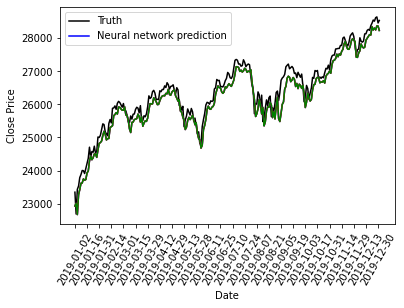

In [25]:
import matplotlib.pyplot as plt
plt.plot(data_test.index, y_test, c='k')
plt.plot(data_test.index, predictions, c='b')
plt.plot(data_test.index, predictions, c='r')
plt.plot(data_test.index, predictions, c='g')
plt.xticks(range(0,252,10), rotation=60)
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend(['Truth','Neural network prediction'])
plt.show()